In [3]:
factors = ["DEP", "ED", "PI", "MHP", "GDP", "NOI"]

## Scaling

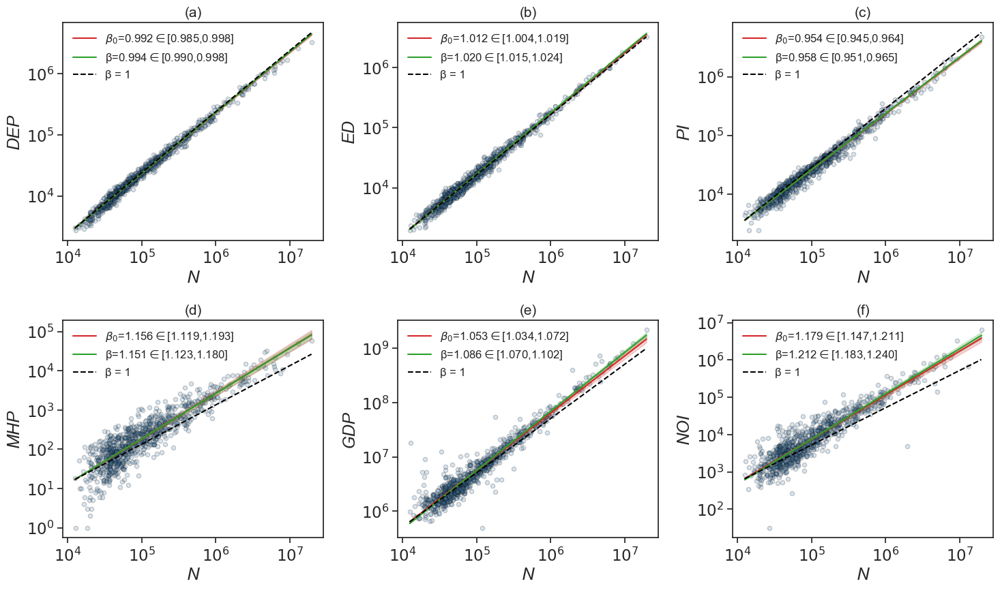

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator, FuncFormatter
plt.rc("font", family="Arial")

# ------------ config ------------
m1_path = '../00_data/14_output/SAMIs_pop.csv'          
m2_path = '../00_data/14_output/FsAMIs_0903_pop_ko.csv'
m1_name = 'SAMI'
m2_name = 'FsAMI'


# ------------ helpers ------------
def harmonize_factor_names(df):
    df = df.copy()
    df.loc[df['factor'] == 'gdp', 'factor'] = 'GDP'
    df.loc[df['factor'] == 'mental_health_providers', 'factor'] = 'MHP'
    df.loc[df['factor'] == 'DEPRESSION', 'factor'] = 'DEP'
    df.loc[df['factor'] == 'noise50n', 'factor'] = 'NOI'
    df.loc[df['factor'] == 'BINGE', 'factor'] = 'ED'
    df.loc[df['factor'] == 'FFR20', 'factor'] = 'FFR'
    df.loc[df['factor'] == 'LPA', 'factor'] = 'PI'
    return df

def prep_model_df(path, factors, drop_cols):
    df = pd.read_csv(path)
    df = harmonize_factor_names(df)
    df = df.loc[df['factor'].isin(factors)].drop(columns=drop_cols, errors='ignore')
    df = (df.groupby('factor', as_index=False)
            .mean(numeric_only=True))
    return df.set_index('factor')

def compute_intercepts(dfm, x_all, y_logs, factors):

    dfm = dfm.copy()
    dfm['beta'] = pd.to_numeric(dfm['beta'], errors='raise')
    intercepts = {}
    for f in factors:
        y = y_logs[f]
        mask = np.isfinite(x_all) & np.isfinite(y)
        x_f = x_all[mask]
        y_f = y[mask]
        b   = float(dfm.at[f, 'beta'])
        a   = (y_f - b * x_f).mean()
        intercepts[f] = float(a)
    dfm['intercept'] = pd.Series(intercepts)
    return dfm

# ------------ data: raw scatter base ------------
df_raw = pd.read_csv("../00_data/13_final/cbsa_level.csv")
df_raw = df_raw.rename(columns={
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
})
data = df_raw[factors + ['cbsacode','TotalPopulation']].dropna()

# log10-safe
data_ = data[["TotalPopulation"] + factors].copy()
for c in ["TotalPopulation"] + factors:
    data_.loc[data_[c] <= 0, c] = np.nan

x_all = np.log10(data_["TotalPopulation"]).values
y_logs = {f: np.log10(data_[f]).values for f in factors}

# ------------ model tables ------------
dfm1 = prep_model_df(m1_path, factors, drop_cols=['SAMI','cbsacode','Unnamed: 0'])
dfm2 = prep_model_df(m2_path, factors, drop_cols=['FsAMI','cbsacode'])

# intercept
dfm1 = compute_intercepts(dfm1, x_all, y_logs, factors)
dfm2 = compute_intercepts(dfm2, x_all, y_logs, factors)

# ------------ plot 2×3 with two models overlaid ------------
pow10fmt = FuncFormatter(lambda k, pos: rf"$10^{{{int(np.round(k))}}}$")
sns.set_theme(style="ticks", font_scale=1.5)
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
panel_labels = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)"]

for ax, f, lbl in zip(axes.flat, factors, panel_labels):
    y = y_logs[f]
    mask = np.isfinite(x_all) & np.isfinite(y)
    x_f = x_all[mask]
    y_f = y[mask]

    # scatter once
    ax.scatter(x_f, y_f, s=20, alpha=0.2, edgecolor="black", color="steelblue")

    # starting poing
    x0 = x_f.min()

    # ---- SAMI ----
    b1  = float(dfm1.at[f, "beta"])
    a1  = float(dfm1.at[f, "intercept"])
    lo1 = float(dfm1.at[f, "CI_lower"]) if "CI_lower" in dfm1.columns else b1
    hi1 = float(dfm1.at[f, "CI_upper"]) if "CI_upper" in dfm1.columns else b1
    y01 = a1 + b1 * x0
    xx  = np.linspace(x_f.min(), x_f.max(), 200)

    ax.plot(xx, y01 + b1 * (xx - x0), lw=1.5, color="#D62728", label=f"$β_0$={b1:.3f}$\in$[{lo1:.3f},{hi1:.3f}]")
    if "CI_lower" in dfm1.columns and "CI_upper" in dfm1.columns:
        ax.fill_between(xx, y01 + lo1 * (xx - x0), y01 + hi1 * (xx - x0), alpha=0.20, color="#D62728")

    # ---- FsAMI ----
    b2  = float(dfm2.at[f, "beta"])
    a2  = float(dfm2.at[f, "intercept"])
    lo2 = float(dfm2.at[f, "CI_lower"]) if "CI_lower" in dfm2.columns else b2
    hi2 = float(dfm2.at[f, "CI_upper"]) if "CI_upper" in dfm2.columns else b2
    y02 = a2 + b2 * x0

    ax.plot(xx, y02 + b2 * (xx - x0), lw=1.5, ls='-', color="#2CA02C", label=f"β={b2:.3f}$\in$[{lo2:.3f},{hi2:.3f}]")
    if "CI_lower" in dfm2.columns and "CI_upper" in dfm2.columns:
        ax.fill_between(xx, y02 + lo2 * (xx - x0), y02 + hi2 * (xx - x0), alpha=0.20, color="#2CA02C")

    # β=1
    ax.plot(xx, y01 + 1.0 * (xx - x0), color="black", lw=1.5, ls="--", label="β = 1")

    # 10^k
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=6))
    ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins=6))
    ax.xaxis.set_major_formatter(pow10fmt)
    ax.yaxis.set_major_formatter(pow10fmt)

    ax.set_xlabel("N", fontstyle="italic")
    ax.set_ylabel(f, fontstyle="italic")
    ax.set_title(f"{lbl}", fontsize=15)
    ax.legend(loc="upper left", frameon=False, fontsize=12)

plt.tight_layout()
plt.show()

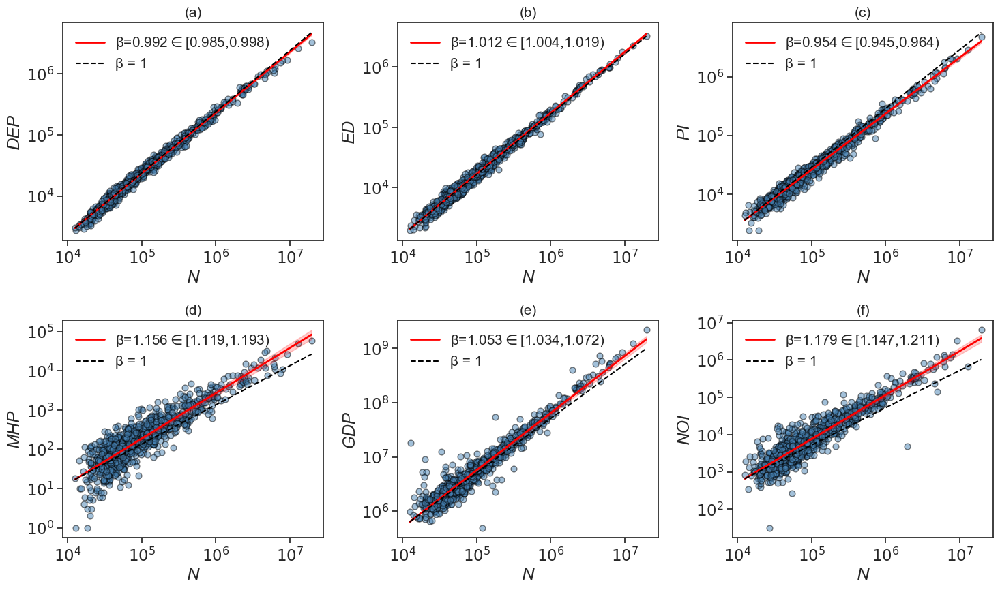

In [21]:
import numpy as np
import pandas as pd  # <-- make sure this is imported
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator, FuncFormatter
plt.rc("font", family="Arial")

df = pd.read_csv('../00_data/14_output/SAMIs_pop.csv')

df.loc[df['factor'] == 'gdp', 'factor'] = 'GDP'
df.loc[df['factor'] == 'mental_health_providers', 'factor'] = 'MHP'
df.loc[df['factor'] == 'DEPRESSION', 'factor'] = 'DEP'
df.loc[df['factor'] == 'noise50n', 'factor'] = 'NOI'
df.loc[df['factor'] == 'BINGE', 'factor'] = 'ED'
df.loc[df['factor'] == 'FFR20', 'factor'] = 'FFR'
df.loc[df['factor'] == 'LPA', 'factor'] = 'PI'

df_models = df.loc[df['factor'].isin(factors)].drop(columns=['SAMI','cbsacode','Unnamed: 0']).drop_duplicates().reset_index(drop=True)

df_raw = pd.read_csv("../00_data/13_final/cbsa_level.csv")
df_raw = df_raw.rename(columns={
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
})
data = df_raw[factors +['cbsacode','TotalPopulation']].dropna()

# log10-safe copy
data_ = data[["TotalPopulation"] + factors].copy()
for c in ["TotalPopulation"] + factors:
    data_.loc[data_[c] <= 0, c] = np.nan

x_all = np.log10(data_["TotalPopulation"]).values
y_logs = {f: np.log10(data_[f]).values for f in factors}

# ---- compute intercepts with aligned masks; read beta as a scalar
dfm = df_models.set_index("factor").copy()   # <-- factor is now the index
intercepts = {}
for f in factors:
    y = y_logs[f]
    mask = np.isfinite(x_all) & np.isfinite(y)
    x_f = x_all[mask]
    y_f = y[mask]
    # If 'factor' is a column, make it the index
    if 'factor' in dfm.columns:
        dfm = dfm.set_index('factor')

    # Ensure single row per factor
    if not dfm.index.is_unique:
        raise ValueError("dfm index has duplicates; expected unique factors.")

    # Ensure single 'beta' column and numeric
    if not dfm.columns.is_unique:
        raise ValueError("dfm has duplicate column names.")
    dfm['beta'] = pd.to_numeric(dfm['beta'], errors='raise')

    b = float(dfm.at[f, 'beta']) 

    a   = (y_f - b * x_f).mean()             # α = mean(y - βx) on aligned rows
    intercepts[f] = float(a)

# write intercepts back by factor (no misalignment)
dfm["intercept"] = pd.Series(intercepts)

# ---- plotting
pow10fmt = FuncFormatter(lambda k, pos: rf"$10^{{{int(np.round(k))}}}$")
sns.set_theme(style="ticks",font_scale=1.5)
fig, axes = plt.subplots(2, 3, figsize=(15, 9))

panel_labels = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)"]

for ax, f, lbl in zip(axes.flat, factors, panel_labels):
    y = y_logs[f]
    mask = np.isfinite(x_all) & np.isfinite(y)
    x_f = x_all[mask]
    y_f = y[mask]

    # scatter
    ax.scatter(x_f, y_f, s=40, alpha=0.5, edgecolor="black", color="steelblue")

    # model params
    b  = float(dfm.at[f, "beta"])
    lo = float(dfm.at[f, "CI_lower"])
    hi = float(dfm.at[f, "CI_upper"])
    a  = float(dfm.at[f, "intercept"])

    # anchor at minimum observed population
    x0 = x_f.min()
    y0 = a + b * x0           # model-predicted y at x0 (stable anchor)
    xx = np.linspace(x_f.min(), x_f.max(), 200)

    # fitted line anchored at (x0, y0)
    ax.plot(xx, y0 + b * (xx - x0), color="red", lw=2, label=f"β={b:.3f}$\in$[{lo:.3f},{hi:.3f})")
    # CI band anchored the same way using slope CI bounds
    ax.fill_between(xx,
                    y0 + lo * (xx - x0),
                    y0 + hi * (xx - x0),
                    color="red", alpha=0.20)

    # β = 1 baseline sharing the SAME anchor point (x0, y0)
    ax.plot(xx, y0 + 1.0 * (xx - x0), color="black", lw=1.5, ls="--", label="β = 1")

    # tidy tick formatting as 10^k
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=6))
    ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins=6))
    ax.xaxis.set_major_formatter(pow10fmt)
    ax.yaxis.set_major_formatter(pow10fmt)

    ax.set_xlabel("N", fontstyle="italic")
    ax.set_ylabel(f, fontstyle="italic")
    ax.set_title(f"{lbl}", fontsize=15) 
    ax.legend(loc="upper left", frameon=False, fontsize=15)

plt.tight_layout()
plt.show()

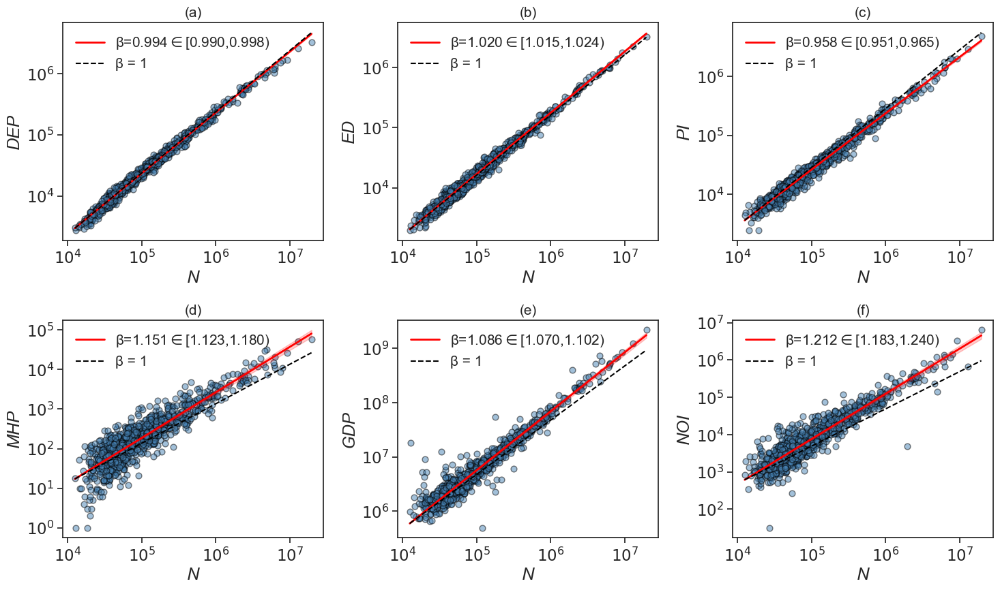

In [15]:
import numpy as np
import pandas as pd  # <-- make sure this is imported
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator, FuncFormatter
plt.rc("font", family="Arial")

df = pd.read_csv('../00_data/14_output/FsAMIs_0903_pop_ko.csv')

df.loc[df['factor'] == 'gdp', 'factor'] = 'GDP'
df.loc[df['factor'] == 'mental_health_providers', 'factor'] = 'MHP'
df.loc[df['factor'] == 'DEPRESSION', 'factor'] = 'DEP'
df.loc[df['factor'] == 'noise50n', 'factor'] = 'NOI'
df.loc[df['factor'] == 'BINGE', 'factor'] = 'ED'
df.loc[df['factor'] == 'FFR20', 'factor'] = 'FFR'
df.loc[df['factor'] == 'LPA', 'factor'] = 'PI'

df_models = df.loc[df['factor'].isin(factors)].drop(columns=['FsAMI','cbsacode']).drop_duplicates().reset_index(drop=True)

df_raw = pd.read_csv("../00_data/13_final/cbsa_level.csv")
df_raw = df_raw.rename(columns={
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
})
data = df_raw[factors +['cbsacode','TotalPopulation']].dropna()

# log10-safe copy
data_ = data[["TotalPopulation"] + factors].copy()
for c in ["TotalPopulation"] + factors:
    data_.loc[data_[c] <= 0, c] = np.nan

x_all = np.log10(data_["TotalPopulation"]).values
y_logs = {f: np.log10(data_[f]).values for f in factors}

# ---- compute intercepts with aligned masks; read beta as a scalar
dfm = df_models.set_index("factor").copy()   # <-- factor is now the index
intercepts = {}
for f in factors:
    y = y_logs[f]
    mask = np.isfinite(x_all) & np.isfinite(y)
    x_f = x_all[mask]
    y_f = y[mask]
    b   = float(dfm.at[f, "beta"])
    a   = (y_f - b * x_f).mean()             # α = mean(y - βx) on aligned rows
    intercepts[f] = float(a)

# write intercepts back by factor (no misalignment)
dfm["intercept"] = pd.Series(intercepts)

# ---- plotting
pow10fmt = FuncFormatter(lambda k, pos: rf"$10^{{{int(np.round(k))}}}$")
sns.set_theme(style="ticks",font_scale=1.5)
fig, axes = plt.subplots(2, 3, figsize=(15, 9))

panel_labels = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)"]

for ax, f, lbl in zip(axes.flat, factors, panel_labels):
    y = y_logs[f]
    mask = np.isfinite(x_all) & np.isfinite(y)
    x_f = x_all[mask]
    y_f = y[mask]

    # scatter
    ax.scatter(x_f, y_f, s=40, alpha=0.5, edgecolor="black", color="steelblue")

    # model params
    b  = float(dfm.at[f, "beta"])
    lo = float(dfm.at[f, "CI_lower"])
    hi = float(dfm.at[f, "CI_upper"])
    a  = float(dfm.at[f, "intercept"])

    # anchor at minimum observed population
    x0 = x_f.min()
    y0 = a + b * x0           # model-predicted y at x0 (stable anchor)
    xx = np.linspace(x_f.min(), x_f.max(), 200)

    # fitted line anchored at (x0, y0)
    ax.plot(xx, y0 + b * (xx - x0), color="red", lw=2, label=f"β={b:.3f}$\in$[{lo:.3f},{hi:.3f})")
    # CI band anchored the same way using slope CI bounds
    ax.fill_between(xx,
                    y0 + lo * (xx - x0),
                    y0 + hi * (xx - x0),
                    color="red", alpha=0.20)

    # β = 1 baseline sharing the SAME anchor point (x0, y0)
    ax.plot(xx, y0 + 1.0 * (xx - x0), color="black", lw=1.5, ls="--", label="β = 1")

    # tidy tick formatting as 10^k
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=6))
    ax.yaxis.set_major_locator(MaxNLocator(integer=True, nbins=6))
    ax.xaxis.set_major_formatter(pow10fmt)
    ax.yaxis.set_major_formatter(pow10fmt)

    ax.set_xlabel("N", fontstyle="italic")
    ax.set_ylabel(f, fontstyle="italic")
    ax.set_title(f"{lbl}", fontsize=15) 
    ax.legend(loc="upper left", frameon=False, fontsize=15)

plt.tight_layout()
plt.show()

## Correlation and Distribution

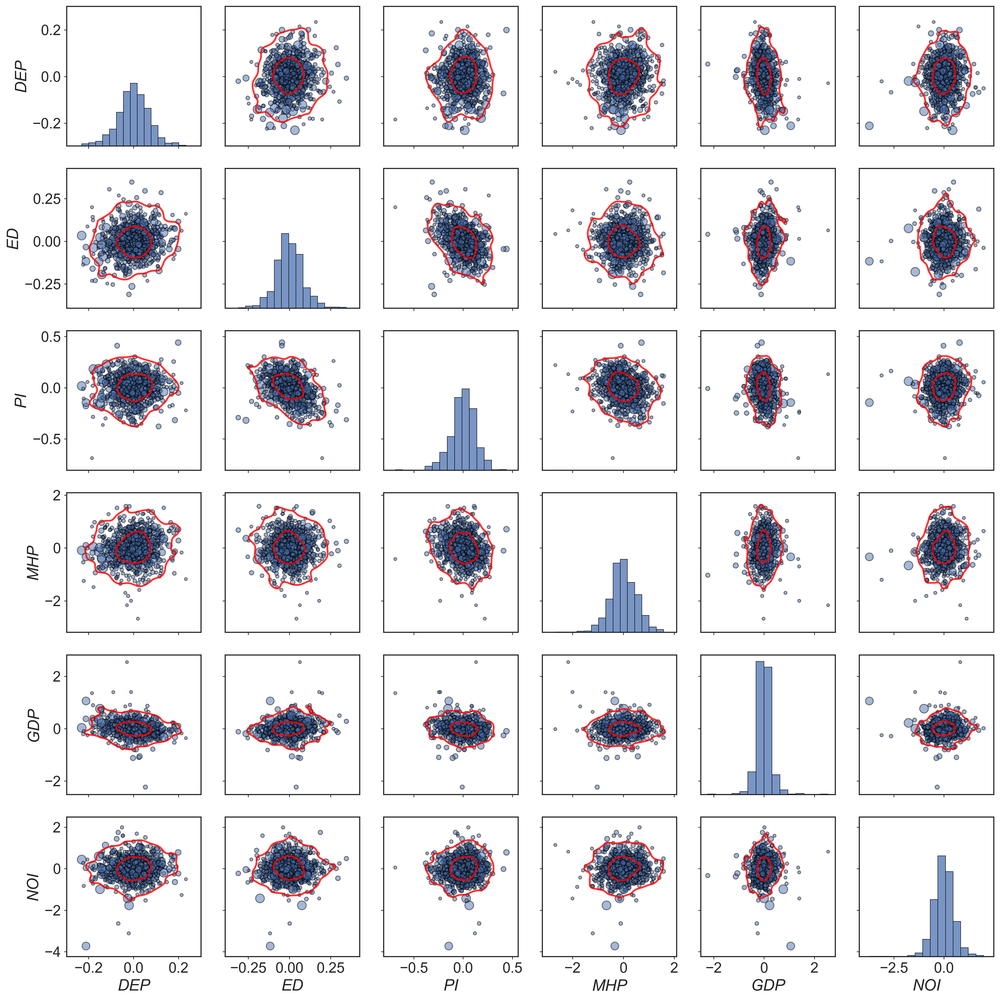

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- Load & tidy --------------------------------------------------------------
df = pd.read_csv('../00_data/14_output/FsAMI_results_0924.csv')

# Map long factor names to short labels (values, not column names)
factor_map = {
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
}
df['factor'] = df['factor'].replace(factor_map)

# Keep only selected factors
df_select = df.loc[df['factor'].isin(factors)]

# Pivot to wide: one row per CBSA with factor columns
dfp = (
    df_select
    .pivot(index="cbsacode", columns="factor", values='FsAMI')
    .reset_index()
)

# Merge population and drop NAs
# NOTE: ensure df_raw has ('cbsacode','TotalPopulation')
df_cleaned = (
    dfp
    .merge(df_raw[['cbsacode','TotalPopulation']], on='cbsacode', how='inner')
    .dropna(subset=factors)
)

# Data for plotting (factors + population kept for size mapping)
factor_cols = factors
df_plot = df_cleaned[['TotalPopulation'] + factor_cols].copy()

# --- Style --------------------------------------------------------------------
sns.set_theme(style="ticks", font_scale=1.5)
plt.rc("font", family="Arial")
plt.rcParams.update({
    "figure.dpi": 300
})

# --- Marker size mapping (area in points^2) -----------------------------------
pop = df_plot['TotalPopulation']

# Clip extremes and use sqrt scaling for perceptual balance
pop_clip = pop.clip(upper=pop.quantile(0.98))
s_min, s_max = 10, 100  # adjust if you want bigger/smaller bubbles
pop_sqrt = np.sqrt(pop_clip)
sizes_all = s_min + (pop_sqrt - pop_sqrt.min()) / (pop_sqrt.max() - pop_sqrt.min()) * (s_max - s_min)
sizes_all = sizes_all.astype(float)

# --- PairGrid with custom scatter --------------------------------------------
g = sns.PairGrid(df_plot, vars=factor_cols, height=2.7, corner=False, despine=False)

def scatter_pop(x, y, color=None, **kwargs):
    ax = plt.gca()
    # Align sizes to the subset of rows used in this panel
    s = sizes_all.loc[x.index]
    ax.scatter(x, y, s=s, alpha=0.5, edgecolors='black')
    sns.kdeplot(
        x=x, y=y,
        levels=3,  # number of contour rings
        color="red",
        linewidths=2.0,
        alpha=0.8,
        fill=False,
        ax=ax
    )

g.map_offdiag(scatter_pop)
g.map_diag(sns.histplot, bins=15, edgecolor='black', linewidth=0.5)

# Ticks & labels
for ax in g.axes.flatten():
    if ax is not None:
        ax.tick_params(axis='both', which='both', length=3, width=0.8)
        xlabel = ax.get_xlabel()
        ylabel = ax.get_ylabel()
        if xlabel:
            ax.set_xlabel(xlabel, fontstyle="italic")
        if ylabel:
            ax.set_ylabel(ylabel, fontstyle="italic")
            
# Title & layout
g.fig.tight_layout()
plt.show()

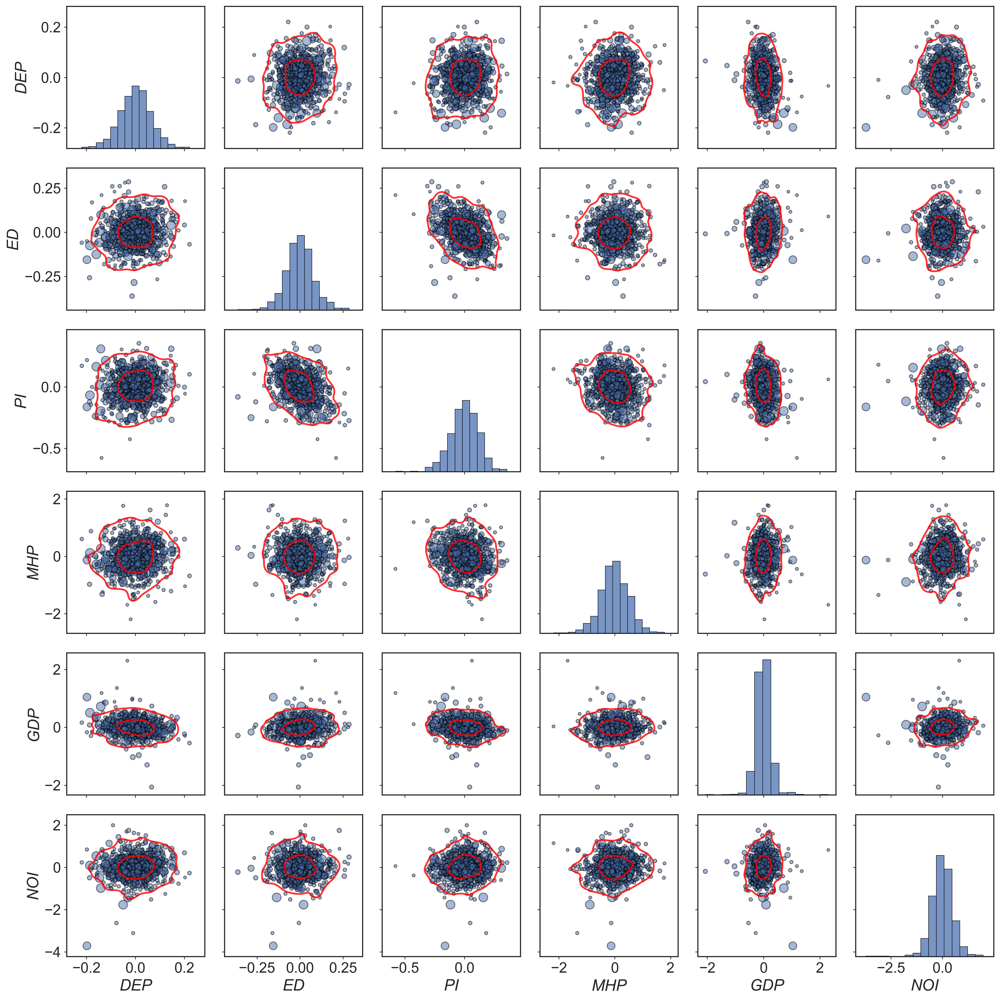

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- Load & tidy --------------------------------------------------------------
df = pd.read_csv('../00_data/14_output/FsAMIs_0903_pop_ko.csv')

# Map long factor names to short labels (values, not column names)
factor_map = {
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
}
df['factor'] = df['factor'].replace(factor_map)

# Keep only selected factors
df_select = df.loc[df['factor'].isin(factors)]

# Pivot to wide: one row per CBSA with factor columns
dfp = (
    df_select
    .pivot(index="cbsacode", columns="factor", values='FsAMI')
    .reset_index()
)

# Merge population and drop NAs
# NOTE: ensure df_raw has ('cbsacode','TotalPopulation')
df_cleaned = (
    dfp
    .merge(df_raw[['cbsacode','TotalPopulation']], on='cbsacode', how='inner')
    .dropna(subset=factors)
)

# Data for plotting (factors + population kept for size mapping)
factor_cols = factors
df_plot = df_cleaned[['TotalPopulation'] + factor_cols].copy()

# --- Style --------------------------------------------------------------------
sns.set_theme(style="ticks", font_scale=1.5)
plt.rc("font", family="Arial")
plt.rcParams.update({
    "figure.dpi": 300
})

# --- Marker size mapping (area in points^2) -----------------------------------
pop = df_plot['TotalPopulation']

# Clip extremes and use sqrt scaling for perceptual balance
pop_clip = pop.clip(upper=pop.quantile(0.98))
s_min, s_max = 10, 100  # adjust if you want bigger/smaller bubbles
pop_sqrt = np.sqrt(pop_clip)
sizes_all = s_min + (pop_sqrt - pop_sqrt.min()) / (pop_sqrt.max() - pop_sqrt.min()) * (s_max - s_min)
sizes_all = sizes_all.astype(float)

# --- PairGrid with custom scatter --------------------------------------------
g = sns.PairGrid(df_plot, vars=factor_cols, height=2.7, corner=False, despine=False)

def scatter_pop(x, y, color=None, **kwargs):
    ax = plt.gca()
    # Align sizes to the subset of rows used in this panel
    s = sizes_all.loc[x.index]
    ax.scatter(x, y, s=s, alpha=0.5, edgecolors='black')
    sns.kdeplot(
        x=x, y=y,
        levels=3,  # number of contour rings
        color="red",
        linewidths=2.0,
        alpha=0.8,
        fill=False,
        ax=ax
    )

g.map_offdiag(scatter_pop)
g.map_diag(sns.histplot, bins=15, edgecolor='black', linewidth=0.5)

# Ticks & labels
for ax in g.axes.flatten():
    if ax is not None:
        ax.tick_params(axis='both', which='both', length=3, width=0.8)
        xlabel = ax.get_xlabel()
        ylabel = ax.get_ylabel()
        if xlabel:
            ax.set_xlabel(xlabel, fontstyle="italic")
        if ylabel:
            ax.set_ylabel(ylabel, fontstyle="italic")
            
# Title & layout
g.fig.tight_layout()
plt.show()

## Moran's I

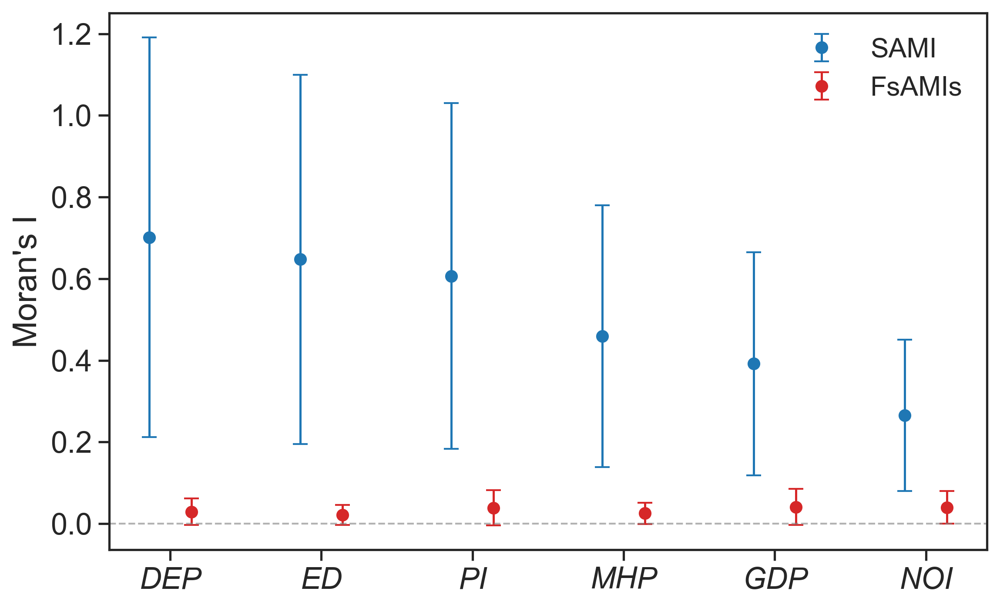

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

df = pd.read_csv('../00_data/14_output/FsAMIs_0903_pop_ko.csv')

df.loc[df['factor'] == 'gdp', 'factor'] = 'GDP'
df.loc[df['factor'] == 'mental_health_providers', 'factor'] = 'MHP'
df.loc[df['factor'] == 'DEPRESSION', 'factor'] = 'DEP'
df.loc[df['factor'] == 'noise50n', 'factor'] = 'NOI'
df.loc[df['factor'] == 'BINGE', 'factor'] = 'ED'
df.loc[df['factor'] == 'FFR20', 'factor'] = 'FFR'
df.loc[df['factor'] == 'LPA', 'factor'] = 'PI'

df_models = df.loc[df['factor'].isin(factors)].drop(columns=['FsAMI','cbsacode']).drop_duplicates().reset_index(drop=True)


df_plot = df_models.loc[df_models['factor'].isin(factors)].copy()
df_plot['factor'] = pd.Categorical(df_plot['factor'], categories=factors, ordered=True)
df_plot = df_plot.sort_values('factor')

# Derive 95% CI half-widths from p-values (two-sided normal approx around 0)
def ci_half_from_p(value, p, alpha=0.05):
    if pd.isna(value) or pd.isna(p) or p <= 0:
        p = 1e-16  # avoid inf
    z_obs = norm.isf(p/2.0)          # z such that P(|Z|>=z)=p
    se    = abs(value) / z_obs       # value ≈ z_obs * se  (testing against 0)
    z95   = norm.ppf(1 - alpha/2.0)  # 1.96
    return z95 * se

df_plot['baseline_ci'] = df_plot.apply(
    lambda r: ci_half_from_p(r['baseline_moran_value'], r['baseline_moran_p']), axis=1
)
df_plot['final_ci'] = df_plot.apply(
    lambda r: ci_half_from_p(r['final_moran_value'], r['final_moran_p']), axis=1
)

# ---- PLOT ----
sns.set_theme(style="ticks", font_scale=1.5)
fig, ax = plt.subplots(figsize=(8, 5))

x = np.arange(len(factors))
width = 0.28

ax.errorbar(
    x - width/2,
    df_plot['baseline_moran_value'],
    yerr=df_plot['baseline_ci'],
    fmt='o', capsize=4, elinewidth=1.2, linewidth=0,
    label="SAMI", color='tab:blue'
)
ax.errorbar(
    x + width/2,
    df_plot['final_moran_value'],
    yerr=df_plot['final_ci'],
    fmt='o', capsize=4, elinewidth=1.2, linewidth=0,
    label="FsAMIs", color='tab:red'
)

# zero reference
ax.axhline(0, color='gray', linewidth=1, linestyle='--', alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels(factors, fontstyle="italic")
ax.set_ylabel("Moran's I")
ax.legend(loc="upper right", frameon=False, fontsize=15) 
plt.tight_layout()
plt.show()

In [6]:
df_models

,factor,best_k,baseline_moran_value,baseline_moran_p,final_moran_value,final_moran_p,selected_m_eigs,beta,p_value,CI_lower,CI_upper,AIC
0,ED,12,0.647656,0.005,0.021401,0.083,42,1.019515,0.0,1.014879,1.024150,-1833.959834
1,DEP,9,0.701234,0.005,0.029164,0.079,66,0.993780,0.0,0.989925,0.997635,-2188.492209
2,PI,5,0.606606,0.005,0.038697,0.079,52,0.957922,0.0,0.951126,0.964718,-1196.830248
3,MHP,11,0.459386,0.005,0.025334,0.058,34,1.151497,0.0,1.123054,1.179941,1346.769538
4,GDP,5,0.391563,0.005,0.040877,0.071,28,1.086026,0.0,1.070358,1.101695,302.950580
5,NOI,6,0.265583,0.005,0.039752,0.050,22,1.211661,0.0,1.182870,1.240452,1396.456897
